In [15]:
import h5py
import numpy as np

# Paths to the HDF5 files
train_hdf5_path = "data/musdb18_train_30sec.h5"
test_hdf5_path = "data/musdb18_test_30sec.h5"
valid_hdf5_path = "data/musdb18_valid_30sec.h5"

# Expected number of samples for 30 seconds at 44.1 kHz
expected_samples = 30 * 44100

# Function to verify the length of the audio data and Log-Mel spectrograms
def verify_preprocessed_audio(hdf5_path):
    with h5py.File(hdf5_path, 'r') as hdf5_file:
        # Loop through all tracks
        for track_name in hdf5_file.keys():
            track_group = hdf5_file[track_name]
            print(f"\nVerifying track: {track_name}")
            
            # Print available keys for debugging
            print("Available keys:", list(track_group.keys()))

            for stem_name in ['bass', 'drums', 'mixture', 'other', 'vocals']:
                audio_key = f"{stem_name}_audio"
                log_mel_key = f"{stem_name}_log_mel"

                # Check if audio_key and log_mel_key exist
                if audio_key in track_group and log_mel_key in track_group:
                    audio_data = track_group[audio_key][()]
                    log_mel_data = track_group[log_mel_key][()]
                    
                    # Check audio data length
                    num_samples = audio_data.shape[0]
                    if num_samples == expected_samples:
                        print(f"{stem_name.capitalize()} audio: OK ({num_samples} samples)")
                    else:
                        print(f"{stem_name.capitalize()} audio: ERROR ({num_samples} samples, expected {expected_samples})")

                    # Check Log-Mel spectrogram shape
                    log_mel_shape = log_mel_data.shape
                    if log_mel_shape[0] == 128:  # Assuming 128 Mel bands
                        print(f"{stem_name.capitalize()} Log-Mel: OK ({log_mel_shape[0]} Mel bands, time frames: {log_mel_shape[1]})")
                    else:
                        print(f"{stem_name.capitalize()} Log-Mel: ERROR (Expected 128 Mel bands, got {log_mel_shape[0]})")
                else:
                    print(f"Keys not found for {stem_name}: {audio_key} or {log_mel_key}")

# Verify the preprocessed audio for each split
print("Verifying train split...")
verify_preprocessed_audio(train_hdf5_path)

print("Verifying test split...")
verify_preprocessed_audio(test_hdf5_path)

print("Verifying valid split...")
verify_preprocessed_audio(valid_hdf5_path)


Verifying train split...

Verifying track: A Classic Education - NightOwl
Available keys: ['bass_audio', 'bass_log_mel', 'drums_audio', 'drums_log_mel', 'mixture_audio', 'mixture_log_mel', 'other_audio', 'other_log_mel', 'vocals_audio', 'vocals_log_mel']
Bass audio: OK (1323000 samples)
Bass Log-Mel: OK (128 Mel bands, time frames: 2584)
Drums audio: OK (1323000 samples)
Drums Log-Mel: OK (128 Mel bands, time frames: 2584)
Mixture audio: OK (1323000 samples)
Mixture Log-Mel: OK (128 Mel bands, time frames: 2584)
Other audio: OK (1323000 samples)
Other Log-Mel: OK (128 Mel bands, time frames: 2584)
Vocals audio: OK (1323000 samples)
Vocals Log-Mel: OK (128 Mel bands, time frames: 2584)

Verifying track: ANiMAL - Clinic A
Available keys: ['bass_audio', 'bass_log_mel', 'drums_audio', 'drums_log_mel', 'mixture_audio', 'mixture_log_mel', 'other_audio', 'other_log_mel', 'vocals_audio', 'vocals_log_mel']
Bass audio: OK (1323000 samples)
Bass Log-Mel: OK (128 Mel bands, time frames: 2584)
Drum

Playing first track: A Classic Education - NightOwl
Playing vocals...


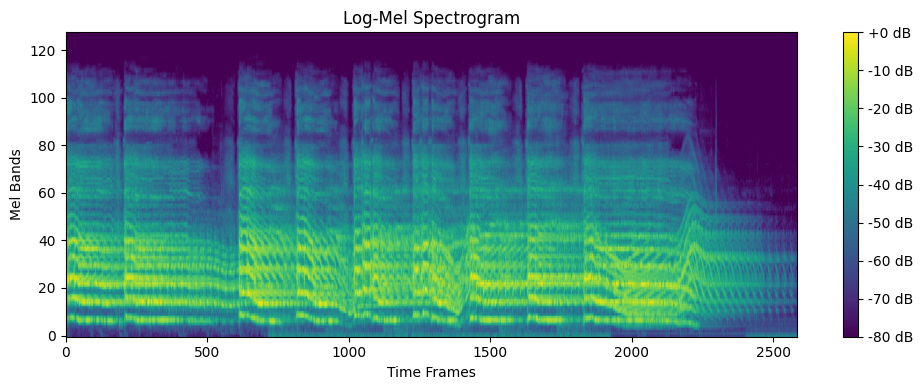

Playing bass...


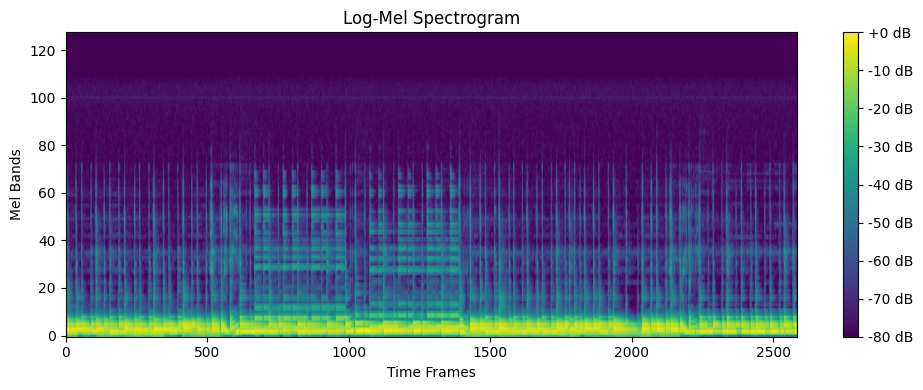

Playing drums...


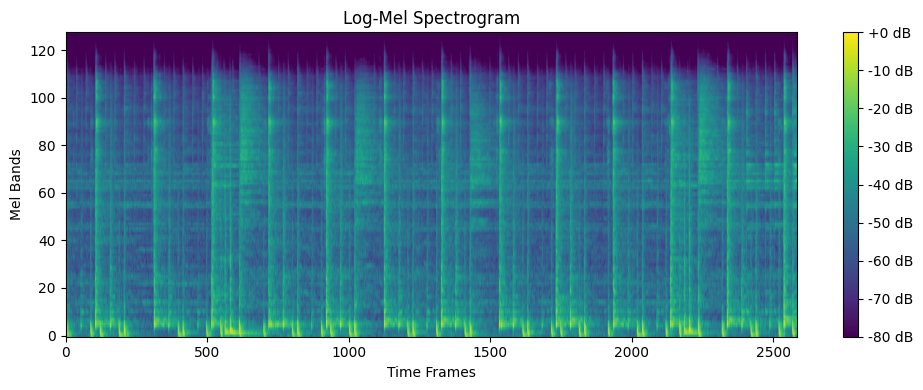

Playing other...


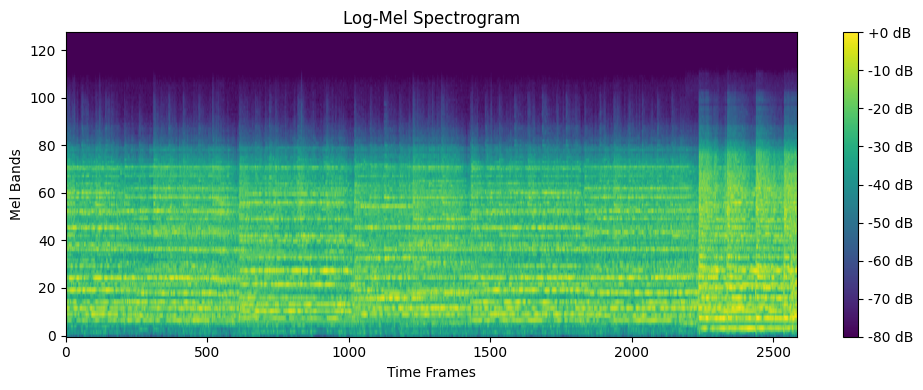

Playing combined track...


In [16]:
import h5py
import numpy as np
import librosa
import matplotlib.pyplot as plt
from IPython.display import Audio, display

# Path to the preprocessed HDF5 file
hdf5_path = "data/musdb18_train_30sec.h5"  # or test/valid

# Function to load and play the audio of a single stem
def play_stem(audio_data, sr=44100):
    return Audio(audio_data, rate=sr)

# Function to plot the Log-Mel spectrogram
def plot_log_mel_spectrogram(log_mel_data):
    plt.figure(figsize=(10, 4))
    plt.imshow(log_mel_data, aspect='auto', origin='lower', cmap='viridis')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Log-Mel Spectrogram')
    plt.xlabel('Time Frames')
    plt.ylabel('Mel Bands')
    plt.tight_layout()
    plt.show()

# Function to load and mix all stems for a track
def load_track_and_stems(hdf5_path, track_name):
    with h5py.File(hdf5_path, 'r') as hdf5_file:
        track_group = hdf5_file[track_name]

        # Load all the stems
        vocals = track_group['vocals_audio'][()]
        bass = track_group['bass_audio'][()]
        drums = track_group['drums_audio'][()]
        other = track_group['other_audio'][()]

        # Load Log-Mel spectrograms for each stem
        log_mel_vocals = track_group['vocals_log_mel'][()]
        log_mel_bass = track_group['bass_log_mel'][()]
        log_mel_drums = track_group['drums_log_mel'][()]
        log_mel_other = track_group['other_log_mel'][()]

        # Option to play each stem separately
        print("Playing vocals...")
        display(play_stem(vocals))
        plot_log_mel_spectrogram(log_mel_vocals)
        
        print("Playing bass...")
        display(play_stem(bass))
        plot_log_mel_spectrogram(log_mel_bass)
        
        print("Playing drums...")
        display(play_stem(drums))
        plot_log_mel_spectrogram(log_mel_drums)
        
        print("Playing other...")
        display(play_stem(other))
        plot_log_mel_spectrogram(log_mel_other)

        # Option to mix all stems into a single track (add them together)
        instruments = bass + drums + other
        instruments = np.clip(instruments, -1.0, 1.0)  # Ensure the values are within the valid range

        print("Playing combined track...")
        return play_stem(instruments)

# Load and play the first track in the HDF5 file
def play_first_track(hdf5_path):
    with h5py.File(hdf5_path, 'r') as hdf5_file:
        # Get the first track name
        first_track_name = list(hdf5_file.keys())[0]
        print(f"Playing first track: {first_track_name}")
        
        # Load and play the track
        audio_output = load_track_and_stems(hdf5_path, first_track_name)
        display(audio_output)

# Play the first track
play_first_track(hdf5_path)


In [22]:
import h5py

# Path to your HDF5 dataset
hdf5_path = 'data/musdb18_train_30sec.h5'  # Replace with your actual path

# Load the dataset and print the shape of the 'mixture_log_mel' spectrogram for a specific track
with h5py.File(hdf5_path, 'r') as f:
    track_key = 'A Classic Education - NightOwl'  # Choose one track
    spectrogram = f[track_key]['mixture_log_mel']  # Access the 'mixture_log_mel' data
    print("Mixture Log-Mel spectrogram shape:", spectrogram.shape)


Mixture Log-Mel spectrogram shape: (128, 2584)


In [23]:
import h5py

def check_hdf5_keys(file_path):
    with h5py.File(file_path, 'r') as h5f:
        print("Available keys in the HDF5 file:")
        print(list(h5f.keys()))

# Call this function to check keys in your training data
check_hdf5_keys('data/musdb18_train_30sec.h5')


Available keys in the HDF5 file:
['A Classic Education - NightOwl', 'ANiMAL - Clinic A', 'ANiMAL - Easy Tiger', 'ANiMAL - Rockshow', "Actions - Devil's Words", 'Actions - One Minute Smile', 'Actions - South Of The Water', 'Aimee Norwich - Child', 'Alexander Ross - Goodbye Bolero', 'Alexander Ross - Velvet Curtain', 'Angela Thomas Wade - Milk Cow Blues', 'Atlantis Bound - It Was My Fault For Waiting', 'Auctioneer - Our Future Faces', 'AvaLuna - Waterduct', 'BigTroubles - Phantom', 'Bill Chudziak - Children Of No-one', 'Black Bloc - If You Want Success', 'Celestial Shore - Die For Us', 'Chris Durban - Celebrate', 'Clara Berry And Wooldog - Air Traffic', 'Clara Berry And Wooldog - Stella', 'Clara Berry And Wooldog - Waltz For My Victims', 'Cnoc An Tursa - Bannockburn', 'Creepoid - OldTree', 'Dark Ride - Burning Bridges', 'Dreamers Of The Ghetto - Heavy Love', 'Drumtracks - Ghost Bitch', 'Faces On Film - Waiting For Ga', 'Fergessen - Back From The Start', 'Fergessen - Nos Palpitants', 'Fer

In [24]:
import h5py

def check_track_structure(file_path, track_key):
    with h5py.File(file_path, 'r') as h5f:
        print(f"Available keys in track '{track_key}':")
        print(list(h5f[track_key].keys()))

# Example to check the keys inside a specific track
check_track_structure('data/musdb18_train_30sec.h5', 'A Classic Education - NightOwl')


Available keys in track 'A Classic Education - NightOwl':
['bass_audio', 'bass_log_mel', 'drums_audio', 'drums_log_mel', 'mixture_audio', 'mixture_log_mel', 'other_audio', 'other_log_mel', 'vocals_audio', 'vocals_log_mel']


In [25]:
def check_shapes(hdf5_file, track_key):
    with h5py.File(hdf5_file, 'r') as h5f:
        print(f"Mixture log-Mel shape: {h5f[track_key]['mixture_log_mel'].shape}")
        print(f"Vocals log-Mel shape: {h5f[track_key]['vocals_log_mel'].shape}")
        print(f"Drums log-Mel shape: {h5f[track_key]['drums_log_mel'].shape}")
        print(f"Bass log-Mel shape: {h5f[track_key]['bass_log_mel'].shape}")
        print(f"Other log-Mel shape: {h5f[track_key]['other_log_mel'].shape}")

check_shapes('data/musdb18_train_30sec.h5', 'A Classic Education - NightOwl')


Mixture log-Mel shape: (128, 2584)
Vocals log-Mel shape: (128, 2584)
Drums log-Mel shape: (128, 2584)
Bass log-Mel shape: (128, 2584)
Other log-Mel shape: (128, 2584)
